# Purpose of the Project
1. Utilize AI to enhance the accuracy and efficiency of identifying and localizing diseases.
2. Develop a ResUnet segmentation model, training it to detect brain tumors within images.
3. Understand the concept and significance of transfer learning, including the optimal circumstances for its application to speed up model training.
4. Assess the performance of both the ResNet classifier and ResUnet segmentation models using test datasets.
5. Implement the Keras API for the construction of deep convolutional neural networks.
6. Employ Plotly to create dynamic and interactive data visualizations.

AI in Healthcare is changing Healthcare in several domains, such as the use of surgical robots, disease diagnosis with medical imaging, and maximizing hospital efficiency.

Deep learning is an efficient way of detecting disease and improving the speed and accuracy of diagnosis, often proven to be even superior than X-rays, MRI scans, and CT scans.

In this project, we will be creating a model to detectand localize brain tumors based on MRI scans. This will significantly help reduce the cost of cancer diagnosis and also enable early diagnosis of tumors.

We have been provided with 3929 brain MRI scans along with their brain tumor locations.

We will perform a two stage detection:
1. Train a ResNet deep learning classifier model to detect whether a tumor exists in the image or not.
2. If a tumor has been detected, we will train a ResUnet segmentation model to localize the tumor location on the pixel level.

For this project, we will also perform image segmentation (using the ResUnet architecture) for the following purposes:
1. Understand and extract information from images at the pixel-level.
2. Train a neural network to produce a pixel-wise mask of the image.
3. Perform object recognition and localization.

In the Unet architecture, we encode the image into a vector and decode it back into an image with the same size. Unet formulates a loss function for every pizel in the input image.

A softmax function is applied to every pixel, helping the segmentation problem work as a classification problem, wherein every pixel of the image undergoes classification.

# Part 1: Import Libraries and Datasets

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
%matplotlib inline
from google.colab import files
import random
import os
from sklearn.preprocessing import StandardScaler, normalize
import glob
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import *
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications import DenseNet121

In [ ]:
%cd '/content/Healthcare AI Datasets/Brain_MRI'

/content/Healthcare AI Datasets/Brain_MRI


In [ ]:
#unzipping zipped file with all the data
!unzip /content/Healthcare+AI+Datasets.zip

Archive:  /content/Healthcare+AI+Datasets.zip
replace Healthcare AI Datasets/Brain_MRI/data.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Healthcare AI Datasets/Brain_MRI/data_mask.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Healthcare AI Datasets/Brain_MRI/resnet-50-MRI.json? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Healthcare AI Datasets/Brain_MRI/ResUNet-MRI.json? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Healthcare AI Datasets/Brain_MRI/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Healthcare AI Datasets/Brain_MRI/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_10.tif? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Healthcare AI Datasets/Brain_MRI/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_10_mask.tif? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Healthcare AI Datasets/Brain_MRI/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_11.tif? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Healthcare AI Datasets/

In [ ]:
brain_data = pd.read_csv('data_mask.csv')

In [ ]:
brain_data.head()

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [ ]:
brain_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


The purpose of image segmentation is to comprehend the image at the pixel level, associating each pixel with a specific class. The output produced by image segmentation is the 'mask' of the image.

Masks are represented by the corresponding pixel values with their coordinates. To represent masks, we first platten the images into a 1D array, and then use the indices to create the mask.

In [ ]:
#Get the path to the brain MRI image
brain_data.mask_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

In [ ]:
#Get the path to the segmentation mask
brain_data.image_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: image_path, Length: 3929, dtype: object

<Axes: xlabel='mask', ylabel='count'>

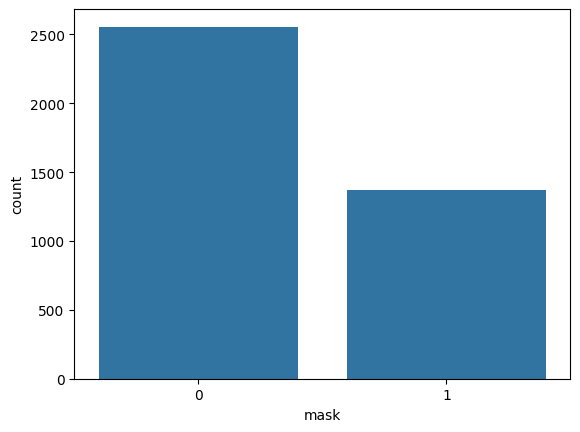

In [ ]:
#Checking if we have a balanced dataset?
sns.countplot(x='mask', data=brain_data)
#we do not have a balanced dataset, we have double the number of patients who do not have tumors.

# Part 2: Perform Data Visualization

In [ ]:
brain_data

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
...,...,...,...,...
3924,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,0
3925,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,0
3926,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,0
3927,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,0


In [ ]:
brain_data['mask'].value_counts().index #we want to know how many categories of mask exist
#0 and 1 mask categories exist in the dataset

Index([0, 1], dtype='int64', name='mask')

In [ ]:
#Use plotly for bar chart
import plotly.graph_objects as go
fig = go.Figure(data=[go.Bar(x=brain_data['mask'].value_counts().index, y=brain_data['mask'].value_counts())])
fig.update_traces(marker_color='rgb(0,200,0)', marker_line_color='rgb(255,0,0)',
                  marker_line_width=5, opacity=0.6)
fig.show()
#We have 2556 samples that belong to class 0 and 1373 samples that belong to class 1

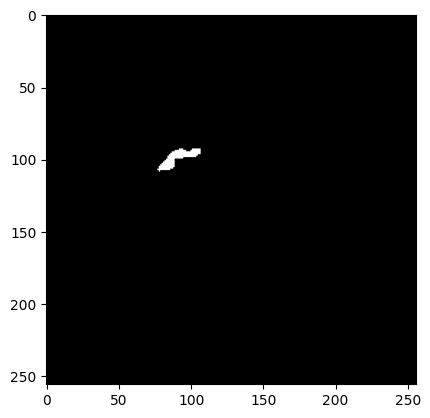

In [ ]:
# Attempt to read the image and display the corresponding picture - choosing index 623 as a random sample

#displaying the mask here
plt.imshow(cv2.imread(brain_data.mask_path[623]))

#we have a pixel level classification. In this image, we have a bunch of pixels and some pixels marked 1 indicate the presence of tumors in the x and y coordinates

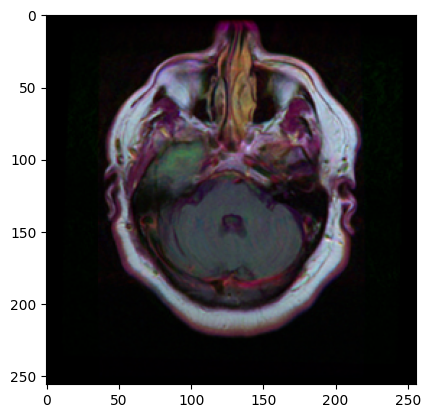

In [ ]:
#visualize one image, as a sample
#the presence of green indicates the location of the tumor there in the brain
plt.imshow(cv2.imread(brain_data.image_path[623]))

In [ ]:
#Let's explore the mask - let's see the minimum and maximum values of the mask
#We know that the black portion of the mask indicates 0 and the white portion of the mask indicates 1, the presence of a tumor
cv2.imread(brain_data.mask_path[623]).min()

0

In [ ]:
cv2.imread(brain_data.mask_path[623]).max()

255

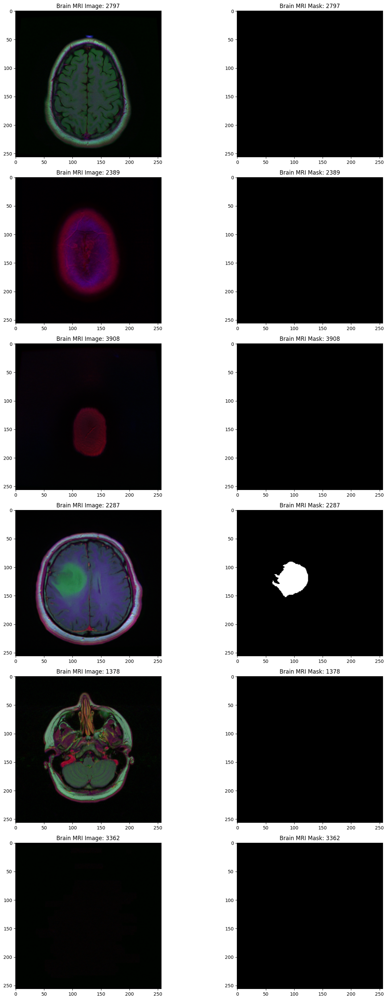

In [ ]:
#Let's visualize the data by looking at the images and masks of the data
#We will visualize the images and their corresponding masks as two columns
fig, axs = plt.subplots(6, 2, figsize =(15, 30)) #Plotting 6 random images and their corresponding masks across two columns
count = 0
for x in range(6):
  i = random.randint(0, len(brain_data)) #selecting a random index using the random library
  axs[count][0].title.set_text("Brain MRI Image: "+str(i)) #MRI image
  #print(type(brain_data.image_path[i]))
  axs[count][0].imshow(cv2.imread(brain_data.image_path[i]))
  axs[count][1].title.set_text("Brain MRI Mask: "+str(i)) #Mask
  axs[count][1].imshow(cv2.imread(brain_data.mask_path[i]))
  count += 1 #just increasing the counter as we go forward
fig.tight_layout()

As a challenge, let's try to plot randomly selected:
1. MRI scan images from only sick patients
2. Corresponding masks of those MRI scans
3. Images and masks on top on one another

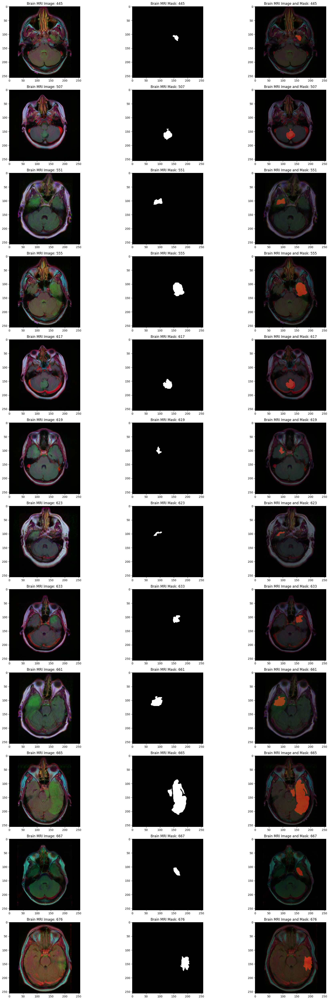

In [ ]:
#Answer to point 1 above:
#Let's visualize the data by looking at the images and masks of the data
#We will visualize the images and their corresponding masks as two columns
fig, axs = plt.subplots(12, 3, figsize =(20, 50)) #Plotting 12 random images
count = 0
for i in range(len(brain_data)):
  if brain_data['mask'][i] == 1 and count < 12: #if the mask is 1
    image = cv2.imread(brain_data.image_path[i])
    mask = cv2.imread(brain_data.mask_path[i], cv2.IMREAD_GRAYSCALE)
    axs[count][0].title.set_text("Brain MRI Image: "+str(i)) #MRI image
    axs[count][0].imshow(image)
    axs[count][1].title.set_text("Brain MRI Mask: "+str(i)) #Mask
    axs[count][1].imshow(mask, cmap = 'gray')
    axs[count][2].title.set_text("Brain MRI Image and Mask: "+str(i))
    axs[count][2].imshow(image)
    image = image[:, :, ::-1]
    red_mask = np.zeros_like(image)
    red_mask[:, :, 0] = mask
    axs[count][2].imshow(red_mask, alpha = 0.5)
    count += 1 #just increasing the counter as we go forward
fig.tight_layout()

# Part 3: Convolutional Neural Networks:
1. The initial CNN layers extract high-level general features. The final couple of CNN layers perform classification on a specific task.
2. Local features scan the image first, searching for simple shapes and patters. The patterns are then picked up by the subsequent layers to form more complex features.

# Part 4: Residual Networks (ResNets):
1. As CNNs become deeper, the vanishing gradient problem tends to occur, negatively impacting model performance.
2. ResNets work as an efficient solution to solve this problem. They include the "skip connection" feature, enabling the training of multiple layers without the vanishing gradient issue,
3. ResNets also work by including "identity mappings" over the CNNs.
4. ImageNet trains the ResNet deep network, and includes 11 million images across 11,000 categories.

#Part 5: Transfer Learning:
1. Transfer Knowledge is a machine learning method to transfer information from a pretrained network to a new network and make minor changes to retrain (or repurpose) it and perform newer (and similar) tasks.
2. Transfer Knowledge is used to accelerate the model training process and save on computationl power and time to train the model.

In transfer knowledge, we take the pretrained network and divide the network such that we extract all the pretrained convolutional layers and copy them into a new network (which would parse through new information). We would also add new dense layers into this new network.

Next, we keep the transfered pre-trained convolutional layers frozen and only train the dense layers to perform a new specific task.

As a result, we keep building on previous knowledge and tasks and increase intelligence due to transfer learning.

There are two strategies to transfer learning:
1. Strategy 1: We freeze the trained CNN network weights from the first layers and then only train the newly added dense layers with randomly initialized weights.
2. Strategy 2: We initialzie the CNN network with pretrained weights and retrain the network while setting learning rate to be very small. Setting the learning rate to be small will ensure that we do not alter the trained weights too much.

The following are some challenges in applying the transfer learning technique:
1. Transfer learning can negatively affect the model if the features of the old and new tasks are not related, causing negative transfer. As a result, we must have newer but similar tasks.
2. There are limits to the amount of knowledge transfered from one network to another, called transfer bounds. Transfer bounds help us assess the robustness and efficacy of the model.

Out of the two strategies, we will be using Strategy 1 for our project.

# Part 6: Train a Classifier Model to Detect the Existence of a Tumor
We will be training two deep neural networks:
1. ResNet deep learning classifier model to detect whether a tumor exists or not. This will be a more basic model.
2. Once a tumor has been detected, we will be using a ResUnet segmentation model to detect the tumor location on the pixel level.

In [ ]:
#Drop the patient id column
brain_data_training = brain_data.drop(columns = ['patient_id'])

In [ ]:
brain_data_training.shape

(3929, 3)

In [ ]:
#To train the model, we will first convert the data in 'mask' to a string format
brain_data_training['mask'] = brain_data_training['mask'].astype(str)

In [ ]:
brain_data_training.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [ ]:
#Splitting data into training and testing data using sklearn
from sklearn.model_selection import train_test_split
train_data, test_data = train_test_split(brain_data_training, test_size = 0.15)


In [ ]:
#create an image data generator to generate our images
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#make a validation split of 0.2
#rescale normalizes our data
datagen = ImageDataGenerator(rescale = 1./255, validation_split = 0.15)

In [ ]:
#If the error on the validation dataset and the training dataset is going down, that is a good sign. This means the network is able to generalize.
#If the training data error is going down but the validation data error is going up, this means that the model is overfitting the data. To solve this, we can try including dropout layers to improve the generalization capability of the model
train_generator = datagen.flow_from_dataframe(
    dataframe = train_data,
    directory = './',
    x_col = 'image_path',
    y_col = 'mask',
    subset = 'training',
    target_size = (256, 256),
    batch_size = 16,
    class_mode = 'categorical',
    shuffle = True)

valid_generator = datagen.flow_from_dataframe(
    dataframe = train_data,
    directory = './',
    x_col = 'image_path',
    y_col = 'mask',
    subset = 'validation',
    target_size = (256, 256),
    batch_size = 16,
    class_mode = 'categorical',
    shuffle = True)

#Data generator for test images
test_data_generator = ImageDataGenerator(rescale = 1./255)
test_generator = test_data_generator.flow_from_dataframe(
    dataframe = test_data,
    directory = './',
    x_col = 'image_path',
    y_col = 'mask',
    target_size = (256, 256),
    batch_size = 16,
    class_mode = 'categorical',
    shuffle = False)


Found 2839 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [ ]:
#ResNet50 base model
#we want to take the pre-trained model and we do not want to include the dense layer at the end
base_model = ResNet50(weights = 'imagenet', include_top = False, input_shape = (256, 256, 3))
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [ ]:
#Freezing the model weights in the convolutional layers
for layer in base_model.layers:
  layer.trainable = False

In [ ]:
#Add the dense layer as the classification head to the base model
head_model = base_model.output
head_model = AveragePooling2D(pool_size = (4,4))(head_model)
head_model = Flatten(name = 'flatten')(head_model)
head_model = Dense(256, activation = 'relu')(head_model)
head_model = Dropout(0.3)(head_model)
head_model = Dense(256, activation = 'relu')(head_model)
head_model = Dropout(0.3)(head_model)
head_model = Dense(2, activation = 'softmax')(head_model)
model = Model(inputs = base_model.input, outputs = head_model)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [ ]:
#Model compilation using the Adam optimizer. #Adam optimization is a stochastic gradient descent method based on ada[tive estimation of first-order and second-order moments.
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
#We will use early stopping to terminate and exit training if validation loss is not decreasing even after a fixed number of epochs.
#If the loss on the validation dataset is going up but that of the training dataset is going down, then the model is overfitting the data. if it happens for one epoch, then that is fine. But for more than 20 epochs, we will use early stopping
early_stopping = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 1, patience = 20)

#we will once again save the best model with the lower validation loss.
checkpointer = ModelCheckpoint(filepath = 'classifier-resnet-weights.hdf5', verbose = 1, save_best_only = True)

In [ ]:
#fitting the model
history = model.fit(train_generator, steps_per_epoch = train_generator.n//16, validation_data = valid_generator, epochs = 1, callbacks = [early_stopping, checkpointer])

177/177 [==============================] - ETA: 0s - loss: 0.7265 - accuracy: 0.6188
Epoch 1: val_loss improved from inf to 0.60971, saving model to classifier-resnet-weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



177/177 [==============================] - 823s 5s/step - loss: 0.7265 - accuracy: 0.6188 - val_loss: 0.6097 - val_accuracy: 0.6740


In [ ]:
##save the model architecture as a json file:
model_json = model.to_json()
with open("classifier-resnet-model.json", "w") as json_file:
    json_file.write(model_json)

#Part 7: Assess Performance of Trained Model
Instead of training a model for a longer duration of time, we will load a pre-trained model which seems to work the best.

In [ ]:
#Load pretrained model
with open('resnet-50-MRI.json', 'r') as json_file:
  json_savedModel = json_file.read()

classifier_model = tf.keras.models.model_from_json(json_savedModel)
classifier_model.load_weights('weights.hdf5') #weights of the pretrained loaded model
classifier_model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
#make predictions using this loaded model
predictions = classifier_model.predict(test_generator, steps = test_generator.n//16, verbose = 1)

36/36 [==============================] - 136s 4s/step


In [ ]:
predictions.shape

(576, 2)

In [ ]:
predictions

array([[1.4052529e-08, 9.9999994e-01],
       [9.9999994e-01, 1.1865871e-08],
       [2.5941046e-11, 9.9999994e-01],
       ...,
       [3.8088038e-10, 9.9999994e-01],
       [9.9959832e-01, 4.0172206e-04],
       [6.3059993e-02, 9.3693995e-01]], dtype=float32)

In [ ]:
#Getting the predicted classes from predictions - rounding off to 0s and 1s
predicted_classes = []
for i in predictions:
  predicted_classes.append(np.argmax(i))

predicted_classes = np.asarray(predicted_classes)

In [ ]:
predicted_classes

array([1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0,

In [ ]:
#Now, we will compare our predicted_labels to our true labels
true_labels = np.asarray(test_data['mask'])[:len(predicted_classes)].astype(int)

In [ ]:
#Determine accuracy of model
from sklearn.metrics import accuracy_score
accuracy_score(true_labels, predicted_classes) #we have very high accuracy

0.9861111111111112

<Axes: >

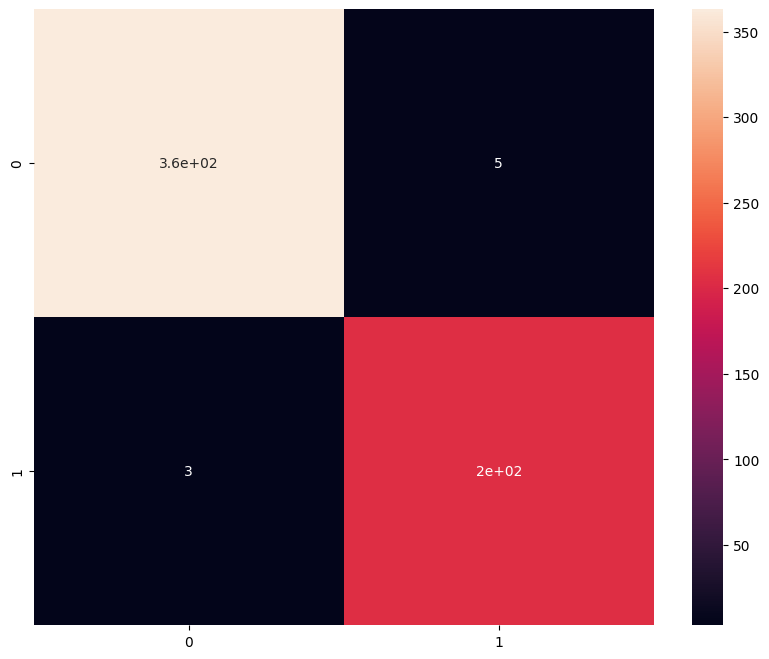

In [ ]:
#Plot confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(true_labels, predicted_classes)
plt.figure(figsize = (10, 8))
sns.heatmap(cm, annot = True)
#We have misclassified only 12 samples, which is great

In [ ]:
#Print classification report
from sklearn.metrics import classification_report
print(classification_report(true_labels, predicted_classes))
#Precision, recall, and f1-score are all pretty good!

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       368
           1       0.98      0.99      0.98       208

    accuracy                           0.99       576
   macro avg       0.98      0.99      0.98       576
weighted avg       0.99      0.99      0.99       576



# Part 8: ResUnet Models
1. ResUnet combines the Unet backbone architecture with residual blocks to prevent the vanishing gradient problem generally occuring with deep networks.
2. ResUnet models are based on Full CNNs to perform well on segmentation tasks.
3. The ResUnet architecture consists of 3 components: (1) Encoder or contracting path (2) Bottleneck (3) Decoder or expansive path

Delving deeper into our architecture, we have:
1. Encoder (Contracting Path): This path contains several contraction blocks, which parse through residual blocks, followed by 2x2 max pooling. After each block doubles, the features map, helping the model gain intelligence and learn complex features with ease.
2. Bottleneck: This serves as a connection between the encoder and the decoder. It takes the input and then passes through a residual block and 2x2 up-sampling convolutional layers.
3. Decoder (Expansive Path): Each block in this path takes up-sampled inouts from the previous layer and concatenates them with the outputs from the residual blocks in the encoder. This ensures that features learned in the encoder are utilized while reconstructing the data. The output from the residual block in the final layer passes through a 1x1 convolutional layer and produces the output with the same input size.


#Part 9: Build a ResUnet Segmentation Model to Localize Brain Tumors

In [ ]:
#Only get data that have masks associated with them
mask_brain_data = brain_data[brain_data['mask'] == 1]
mask_brain_data.shape

(1373, 4)

In [ ]:
#Split data into testing and training data
from sklearn.model_selection import train_test_split
X_train, X_val = train_test_split(mask_brain_data, test_size = 0.15)
X_test, X_val = train_test_split(X_val, test_size = 0.5) #Split x_val in half into X_test and X_val

In [ ]:
#create lists for images and classes as per their image and mask paths
training_images = list(X_train.image_path)
training_masks = list(X_train.mask_path)
validation_images = list(X_val.image_path)
validation_masks = list(X_val.mask_path)

In [ ]:
#Create a data generator using the utilities function for the custom loss function and custom data generator
from utilities import DataGenerator
train_generator = DataGenerator(training_images, training_masks)
val_generator = DataGenerator(validation_images, validation_masks)

In [ ]:
#build residual block
def residual_block(X, f):
  #take a copy of X
  X_copy = X

  #We will have two paths for the residual block - the main path and the short path. We will eventually add the output from the paths and apply an activation function to get the final output from the residual block

  #Main path:
  #he-normal draws samples from a truncated normal distribution centered on 0, with standard deviation as
  #the square root of (2/number of input units in the weight tensor)
  X = Conv2D(f, kernel_size = (1, 1), strides = (1, 1), kernel_initializer = 'he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X)
  X = Conv2D(f, kernel_size = (3, 3), strides = (1, 1), kernel_initializer = 'he_normal', padding = 'same')(X)
  X = BatchNormalization()(X)

  #Short path:
  X_copy = Conv2D(f, kernel_size = (1, 1), strides = (1, 1), kernel_initializer = 'he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)

  #Add the outputs from the main path and the short path
  X = Add()([X, X_copy])
  X = Activation('relu')(X)

  #return final output
  return X

In [ ]:
#Function to up-sample and concatenate the parsed inputs in the decoder
def up_sampling(x, skip):
  x = UpSampling2D(size = (2, 2))(x)
  concat = Concatenate()([x, skip])
  return concat

In [ ]:
#Build the ResUnet network architecture

# Input tensor shape
X_input = Input((256, 256, 3))

# ENCODER:
# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = residual_block(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = residual_block(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = residual_block(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

#BOTTLENECK:
# Stage 5 (Bottle Neck)
conv5_in = residual_block(pool_4, 256)

#DECODER:
# Upscale stage 1
up_1 = up_sampling(conv5_in, conv4_in)
up_1 = residual_block(up_1, 128)

# Upscale stage 2
up_2 = up_sampling(up_1, conv3_in)
up_2 = residual_block(up_2, 64)

# Upscale stage 3
up_3 = up_sampling(up_2, conv2_in)
up_3 = residual_block(up_3, 32)

# Upscale stage 4
up_4 = up_sampling(up_3, conv1_in)
up_4 = residual_block(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

segmentation_model = Model(inputs = X_input, outputs = output )


In [ ]:
#Print out segmentation model summary
segmentation_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['input_2[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 16)         64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         2320      ['batch_normalization[0]

# Part 10: Train the Segmentation Model
We need a custom loss function to train this ResUNet.So,  we have used the loss function as it is from https://github.com/nabsabraham/focal-tversky-unet/blob/master/losses.py


In [ ]:
#The utilities function contains the code for the custom loss function to complete pixel level classification and the custom data generator
from utilities import focal_tversky, tversky_loss, tversky

In [ ]:
#compile model using Adam optimizer
adam = tf.keras.optimizers.Adam(lr = 0.05, epsilon = 0.1)
segmentation_model.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [ ]:
#We will use early stopping to terminate and exit training if validation loss is not decreasing even after a fixed number of epochs.
#If the loss on the validation dataset is going up but that of the training dataset is going down, then the model is overfitting the data. if it happens for one epoch, then that is fine. But for more than 20 epochs, we will use early stopping
early_stopping = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 1, patience = 20)

#we will once again save the best model with the lower validation loss.
checkpointer = ModelCheckpoint(filepath = 'ResUNet-weights.hdf5', verbose = 1, save_best_only = True)

In [ ]:
#Fit the model
history = segmentation_model.fit(train_generator, epochs = 1, validation_data = val_generator, callbacks = [early_stopping, checkpointer])

72/72 [==============================] - ETA: 0s - loss: 0.9243 - tversky: 0.0996 
Epoch 1: val_loss improved from inf to 0.90408, saving model to ResUNet-weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



72/72 [==============================] - 759s 10s/step - loss: 0.9243 - tversky: 0.0996 - val_loss: 0.9041 - val_tversky: 0.1257


In [ ]:
#save the model architecture to json file for future use
model_json = segmentation_model.to_json()
with open("ResUNet-model.json", "w") as json_file:
    json_file.write(model_json)

# Part 11: Assess Trained Segmentation ResUnet Model Performance
Instead of training a model for a longer duration of time, we will load a pre-trained model which seems to work the best.

In [ ]:
#The utilities function contains the code for the custom loss function to complete pixel level classification and the custom data generator
from utilities import focal_tversky, tversky_loss, tversky
#loading pre-trained model
with open('ResUNet-MRI.json', 'r') as json_file:
  json_resunet = json_file.read()

segmentation_model = tf.keras.models.model_from_json(json_resunet)
segmentation_model.load_weights('weights_seg.hdf5') #weights of the pretrained loaded model
#Compiling the model using the Adam optimizer
adam = tf.keras.optimizers.Adam(lr = 0.05, epsilon = 0.1)
segmentation_model.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [ ]:
#The utilities function contains the code for the custom loss function to complete pixel level classification and the custom data generator
from utilities import prediction

#making predictions - we will get the image id, the mask, and whether there is a tumor or not
image, mask, has_mask = prediction(test_data, classifier_model, segmentation_model)

1/1 [==============================] - 0s 388ms/step


In [ ]:
#Storing the results in a dataframe:
predictions_data = pd.DataFrame({'image_path': image, 'predicted_mask': mask, 'has_mask': has_mask})
predictions_data

,image_path,predicted_mask,has_mask
0,TCGA_DU_5851_19950428/TCGA_DU_5851_19950428_23...,"[[[[8.4722683e-07], [3.1259333e-06], [6.476562...",1
1,TCGA_HT_7882_19970125/TCGA_HT_7882_19970125_3.tif,No mask,0
2,TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_29...,"[[[[8.1733987e-07], [3.624844e-06], [9.753522e...",1
3,TCGA_DU_8168_19970503/TCGA_DU_8168_19970503_24...,"[[[[6.6538115e-07], [2.2842328e-06], [4.276361...",1
4,TCGA_FG_8189_20030516/TCGA_FG_8189_20030516_33...,"[[[[9.629919e-07], [5.539618e-06], [1.1138858e...",1
...,...,...,...
585,TCGA_HT_8018_19970411/TCGA_HT_8018_19970411_3.tif,No mask,0
586,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_44...,"[[[[7.09927e-07], [2.588774e-06], [4.6642826e-...",1
587,TCGA_DU_6399_19830416/TCGA_DU_6399_19830416_22...,"[[[[9.023723e-07], [4.124827e-06], [1.2219006e...",1
588,TCGA_FG_7643_20021104/TCGA_FG_7643_20021104_4.tif,No mask,0


In [ ]:
#Merge this new dataframe with the predicted labels along with the test data to assess performance
merged_data = pd.merge(test_data, predictions_data, on = 'image_path')
merged_data.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_DU_5851_19950428/TCGA_DU_5851_19950428_23...,TCGA_DU_5851_19950428/TCGA_DU_5851_19950428_23...,1,"[[[[8.4722683e-07], [3.1259333e-06], [6.476562...",1
1,TCGA_HT_7882_19970125/TCGA_HT_7882_19970125_3.tif,TCGA_HT_7882_19970125/TCGA_HT_7882_19970125_3_...,0,No mask,0
2,TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_29...,TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_29...,1,"[[[[8.1733987e-07], [3.624844e-06], [9.753522e...",1
3,TCGA_DU_8168_19970503/TCGA_DU_8168_19970503_24...,TCGA_DU_8168_19970503/TCGA_DU_8168_19970503_24...,1,"[[[[6.6538115e-07], [2.2842328e-06], [4.276361...",1
4,TCGA_FG_8189_20030516/TCGA_FG_8189_20030516_33...,TCGA_FG_8189_20030516/TCGA_FG_8189_20030516_33...,1,"[[[[9.629919e-07], [5.539618e-06], [1.1138858e...",1


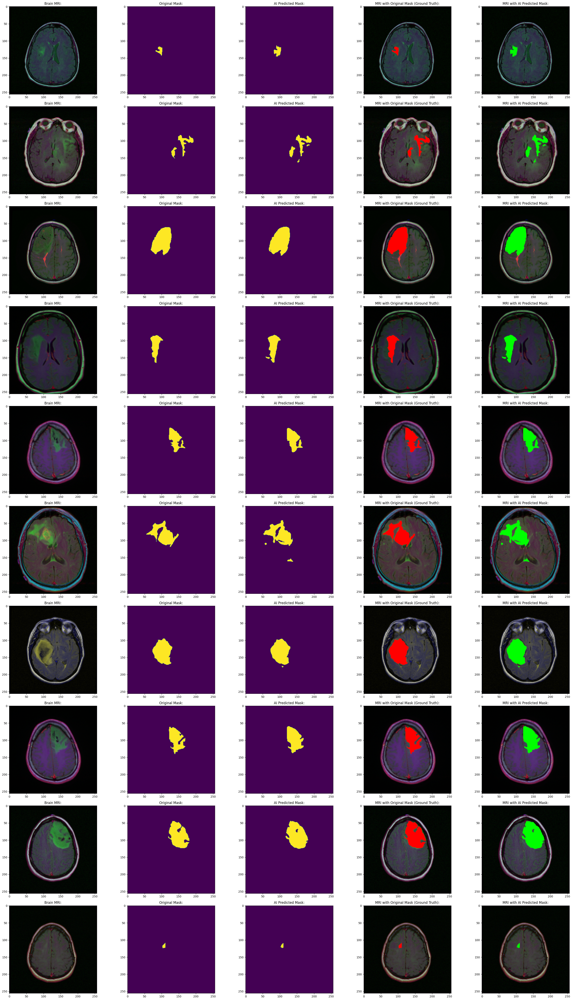

In [ ]:
import matplotlib.pyplot as plt
import cv2
from skimage import io
import numpy as np

# Initialize a counter to keep track of the number of images processed
count = 0

# Set up a figure with 10 rows and 5 columns for the subplots
fig, axs = plt.subplots(10, 5, figsize=(30, 50))

# Loop through the dataset to process and visualize the images
for i in range(len(merged_data)):
    # Check if the current image has an associated mask and if the count is less than 10
    if merged_data['has_mask'][i] == 1 and count < 10:
        # Load the MRI scan image and convert it to RGB format
        img = io.imread(merged_data.image_path[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].set_title("Brain MRI:")
        axs[count][0].imshow(img)

        # Load the original mask image
        mask = io.imread(merged_data.mask_path[i])
        axs[count][1].set_title("Original Mask:")
        axs[count][1].imshow(mask)

        # Load the AI-predicted mask and round its values to get a binary mask
        predicted_mask = np.array(merged_data.predicted_mask[i])[0].squeeze().round()
        axs[count][2].set_title("AI Predicted Mask:")
        axs[count][2].imshow(predicted_mask)

        # Overlay the original mask on the MRI scan and display it
        img_with_mask = img.copy()
        img_with_mask[mask == 255] = (255, 0, 0)
        axs[count][3].set_title("MRI with Original Mask (Ground Truth):")
        axs[count][3].imshow(img_with_mask)

        # Overlay the AI-predicted mask on the MRI scan and display it
        img_with_predicted_mask = img.copy()
        img_with_predicted_mask[predicted_mask == 1] = (0, 255, 0)
        axs[count][4].set_title("MRI with AI Predicted Mask:")
        axs[count][4].imshow(img_with_predicted_mask)

        # Increment the counter after processing each image
        count += 1

# Adjust the layout of the figure to prevent overlap
fig.tight_layout()


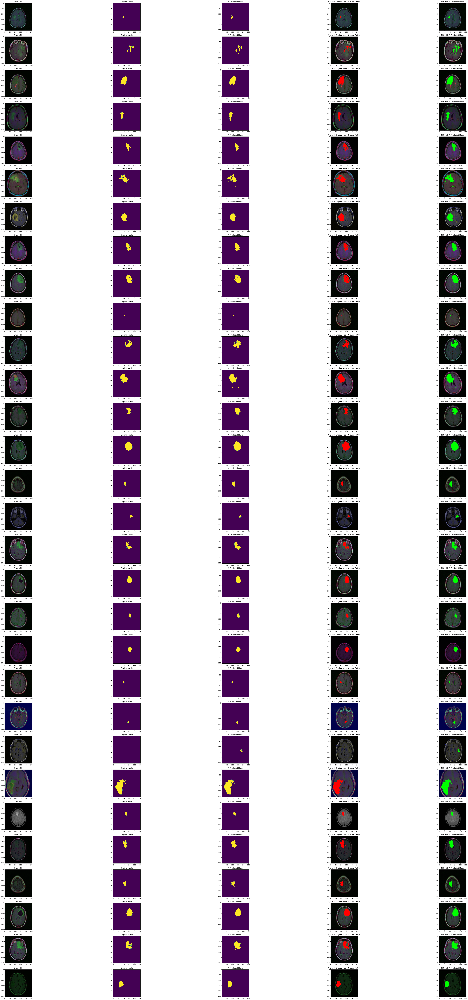

In [ ]:
#Plotting 30 images with their corresponding masks:
import matplotlib.pyplot as plt
import cv2
from skimage import io
import numpy as np

# Initialize a counter to keep track of the number of images processed
count = 0

# Set up a figure with 30 rows and 5 columns for the subplots
fig, axs = plt.subplots(30, 5, figsize=(60, 100))

# Loop through the dataset to process and visualize the images
for i in range(len(merged_data)):
    # Check if the current image has an associated mask and if the count is less than 10
    if merged_data['has_mask'][i] == 1 and count < 30:
        # Load the MRI scan image and convert it to RGB format
        img = io.imread(merged_data.image_path[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].set_title("Brain MRI:")
        axs[count][0].imshow(img)

        # Load the original mask image
        mask = io.imread(merged_data.mask_path[i])
        axs[count][1].set_title("Original Mask:")
        axs[count][1].imshow(mask)

        # Load the AI-predicted mask and round its values to get a binary mask
        predicted_mask = np.array(merged_data.predicted_mask[i])[0].squeeze().round()
        axs[count][2].set_title("AI Predicted Mask:")
        axs[count][2].imshow(predicted_mask)

        # Overlay the original mask on the MRI scan and display it
        img_with_mask = img.copy()
        img_with_mask[mask == 255] = (255, 0, 0)
        axs[count][3].set_title("MRI with Original Mask (Ground Truth):")
        axs[count][3].imshow(img_with_mask)

        # Overlay the AI-predicted mask on the MRI scan and display it
        img_with_predicted_mask = img.copy()
        img_with_predicted_mask[predicted_mask == 1] = (0, 255, 0)
        axs[count][4].set_title("MRI with AI Predicted Mask:")
        axs[count][4].imshow(img_with_predicted_mask)

        # Increment the counter after processing each image
        count += 1

# Adjust the layout of the figure to prevent overlap
fig.tight_layout()
